# Pima Indians Diabetes Database
    This dataset is originally from the National Institute of Diabetes and Digestive and Kidney Diseases. The objective is to predict based on diagnostic measurements whether a patient has diabetes.

    Several constraints were placed on the selection of these instances from a larger database. In particular, all patients here are females at least 21 years old of Pima Indian heritage.

    Pregnancies: Number of times pregnant
    Glucose: Plasma glucose concentration a 2 hours in an oral glucose tolerance test
    BloodPressure: Diastolic blood pressure (mm Hg)
    SkinThickness: Triceps skin fold thickness (mm)
    Insulin: 2-Hour serum insulin (mu U/ml)
    BMI: Body mass index (weight in kg/(height in m)^2)
    DiabetesPedigreeFunction: Diabetes pedigree function
    Age: Age (years)
    Outcome: Class variable (0 or 1)
    

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sn
import random
import pandas_profiling 
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score
#from autoviz.AutoViz_Class import AutoViz_Class
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score

In [2]:
df = pd.read_csv("./data-society-pima-indians-diabetes-database/data/diabetes.csv")

In [3]:
df.head()

,pregnancies,glucose,bloodpressure,skinthickness,insulin,bmi,diabetespedigreefunction,age,outcome
0,6,148,72,35,0,33.6,0.627,50,True
1,1,85,66,29,0,26.6,0.351,31,False
2,8,183,64,0,0,23.3,0.672,32,True
3,1,89,66,23,94,28.1,0.167,21,False
4,0,137,40,35,168,43.1,2.288,33,True


In [4]:
df.shape

(768, 9)

In [5]:
df.isna().sum()

pregnancies                 0
glucose                     0
bloodpressure               0
skinthickness               0
insulin                     0
bmi                         0
diabetespedigreefunction    0
age                         0
outcome                     0
dtype: int64

In [6]:
df.dtypes

pregnancies                   int64
glucose                       int64
bloodpressure                 int64
skinthickness                 int64
insulin                       int64
bmi                         float64
diabetespedigreefunction    float64
age                           int64
outcome                        bool
dtype: object

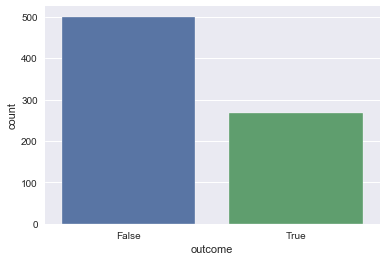

In [7]:
sn.countplot(df["outcome"] , label = "outcomes") 
plt.show()

# Exploratory data analysis using Pandas_profiling

In [8]:
profile =pandas_profiling.ProfileReport(df, title="Pandas Profiling Report",html={"style":{"full_width":True}})
profile.to_widgets()
profile.to_notebook_iframe()
#profile.to_file("Analysis_report.html")
profile

In [9]:
LE = LabelEncoder()
LE.fit(df["outcome"])
df["class"]=LE.transform(df["outcome"])

In [10]:
df.head()

,pregnancies,glucose,bloodpressure,skinthickness,insulin,bmi,diabetespedigreefunction,age,outcome,class
0,6,148,72,35,0,33.6,0.627,50,True,1
1,1,85,66,29,0,26.6,0.351,31,False,0
2,8,183,64,0,0,23.3,0.672,32,True,1
3,1,89,66,23,94,28.1,0.167,21,False,0
4,0,137,40,35,168,43.1,2.288,33,True,1


In [11]:
def data_preparation(df): 
    # Splitting the dataset into the Training set and Test set
    
    X_train, X_test, y_train, y_test = train_test_split(df.drop(columns ="outcome"), df['outcome'],test_size = 0.1,random_state = 0)
    print("================== Before balancing the Training Set ==================== \n",y_train.value_counts())
    print("==================  Testing size Set ==================== \n",y_test.value_counts())
    sn.countplot(y_train,label = "Count")
    plt.show()
    pos_index = y_train[y_train.values == 1].index
    neg_index = y_train[y_train.values == 0].index
    if len(pos_index) > len(neg_index):
        higher = pos_index
        lower = neg_index
    else:
        higher = neg_index
        lower = pos_index

    random.seed(0)
    higher = np.random.choice(higher, size=len(lower))
    lower = np.asarray(lower)
    new_indexes = np.concatenate((lower, higher))

    X_train = X_train.loc[new_indexes,]
    y_train = y_train[new_indexes]
    print("==================== After balancing the Training Set ========================== \n",y_train.value_counts())
    sn.countplot(y_train,label = "Count")
    plt.show()
    return X_train, X_test, y_train, y_test

================== Before balancing the Training Set ==================== 
 False    449
True     242
Name: outcome, dtype: int64
==================  Testing size Set ==================== 
 False    51
True     26
Name: outcome, dtype: int64


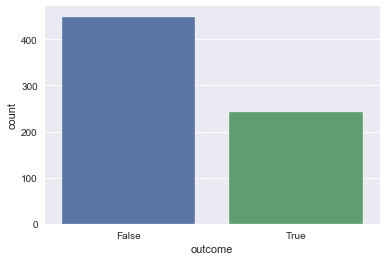

==================== After balancing the Training Set ========================== 
 True     242
False    242
Name: outcome, dtype: int64


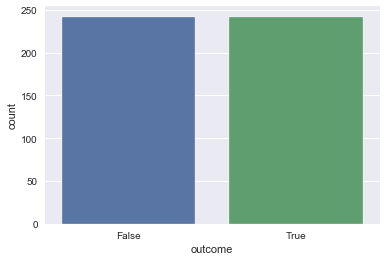

In [12]:
X_train, X_test, y_train, y_test=data_preparation(df)

In [13]:
X_test.head()

,pregnancies,glucose,bloodpressure,skinthickness,insulin,bmi,diabetespedigreefunction,age,class
661,1,199,76,43,0,42.9,1.394,22,1
122,2,107,74,30,100,33.6,0.404,23,0
113,4,76,62,0,0,34.0,0.391,25,0
14,5,166,72,19,175,25.8,0.587,51,1
529,0,111,65,0,0,24.6,0.660,31,0


# Decission tree classifier

In [14]:

def model_building(X_train, X_test, y_train, y_test):
   
    classifier = DecisionTreeClassifier(criterion='gini',splitter='best',max_depth=4,random_state=0)
    y_pred = classifier.fit(X_train, y_train).predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    df_cm = pd.DataFrame(cm, index = (0, 1), columns = (0, 1))
    plt.figure(figsize = (10,7))
    sn.set(font_scale=1.4)
    sn.heatmap(df_cm, annot=True, fmt='g')
    plt.show()
    
    Precission_score = precision_score(y_pred, y_test)
    Recall_Score = recall_score(y_test, y_pred)
    F1_score = f1_score(y_test, y_pred)
    Accuracy_Score = accuracy_score(y_test, y_pred)
    #=============================================== Train Data result ===============================
    train_y_pred = classifier.fit(X_train, y_train).predict(X_train)
    
    
    print("================================= Result Summary ==============================\n")  
    print("Test Data Accuracy: %0.3f" %Accuracy_Score )
    print("Test Data Precission_score: %0.3f" % Precission_score  )
    print("Test Data Recall_Score: %0.3f" % Recall_Score )
    print("Test Data F1_score: %0.3f" % F1_score)
    
    print("Train Data Accuracy: %0.3f" %accuracy_score(y_train,train_y_pred) )
    print("Train Data Precission_score: %0.3f" % precision_score(y_train,train_y_pred))
    print("Train Data Recall_Score: %0.3f" % recall_score(y_train,train_y_pred))
    print("Train Data F1_score: %0.3f" % f1_score(y_train,train_y_pred))
    
    print("================================= cross validation result ==============================\n")  
    accuracies = cross_val_score(estimator = classifier, X = X_train, y = y_train, cv = 5)
    print("Model Accuracy: %0.3f (+/- %0.3f)" % (accuracies.mean(), accuracies.std() * 2))
    
    X_test['class'] = LE.inverse_transform(X_test['class'])
    final_results = pd.concat([X_test['class'], X_test['age']], axis = 1).dropna()
    final_results['predicted_class'] = y_pred
    final_results = final_results[['age', 'class', 'predicted_class']].reset_index(drop=True)


    return final_results

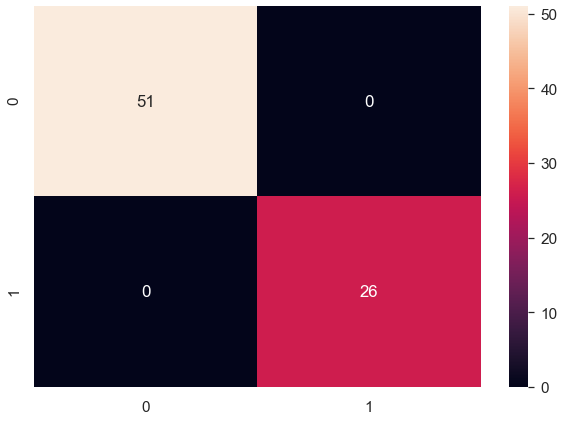

================================= Result Summary ==============================

Test Data Accuracy: 1.000
Test Data Precission_score: 1.000
Test Data Recall_Score: 1.000
Test Data F1_score: 1.000
Train Data Accuracy: 1.000
Train Data Precission_score: 1.000
Train Data Recall_Score: 1.000
Train Data F1_score: 1.000
================================= cross validation result ==============================

Model Accuracy: 1.000 (+/- 0.000)


,age,class,predicted_class
0,22,True,True
1,23,False,False
2,25,False,False
3,51,True,True
4,31,False,False
...,...,...,...
72,25,False,False
73,45,False,False
74,26,True,True
75,30,False,False


In [15]:
model_building(X_train, X_test, y_train, y_test)
